## Introduction
Dans ce Notebook, nous préparons le jeu de données en vue de son exploration

## 1. Importation des librairies

In [1]:
%matplotlib inline
%run utils.ipynb

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import os

import cv2
import random

## 2. Chargement du jeu de données

In [2]:
IS_LARGE_DATA_SET = True

if IS_LARGE_DATA_SET:
    df = pd.read_csv('clouds_0_large.csv')
else:
    df = pd.read_csv('clouds_0_small.csv')
    
df.head(10)

,Image_Label,EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg_Gravel,NaN
3,0011165.jpg_Sugar,NaN
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...
5,002be4f.jpg_Flower,1339279 519 1340679 519 1342079 519 1343479 51...
6,002be4f.jpg_Gravel,NaN
7,002be4f.jpg_Sugar,67495 350 68895 350 70295 350 71695 350 73095 ...
8,0031ae9.jpg_Fish,3510 690 4910 690 6310 690 7710 690 9110 690 1...
9,0031ae9.jpg_Flower,2047 703 3447 703 4847 703 6247 703 7647 703 9...


## 3. Préparation du jeu de données

In [ ]:
df.info()

#### 3.1 Chargement du Dataset pré-enrichi

In [3]:
IS_ENRICHED_PERFOMED = True # Si l'étape suivante a été effectuée alors True ?

if IS_ENRICHED_PERFOMED and os.path.exists('clouds_1_large.csv') and IS_LARGE_DATA_SET:
    df = pd.read_csv('clouds_1_large.csv')
elif IS_ENRICHED_PERFOMED and os.path.exists('clouds_1_small.csv') and not IS_LARGE_DATA_SET:
    df = pd.read_csv('clouds_1_small.csv')
df.head(10)


,ImageId,FileId,EncodedPixels,EncodedPixelsCount,MeanPixelsCloud,StdPixelsCloud,CountPixelsHiddenArea,RatioHiddenArea,CloudRatio,X,Y,W,H,ResizedMaskPixelsCount,BoundingBoxPixelsCount,BoxMaskGap,Label,Class
0,0011165_0,0011165,264918 937 266318 937 267718 937 269118 937 27...,932312,61.81,55.64,119052.0,0.04,0.317113,171.5,196.5,249,235,58264,58515,0.004308,Fish,0
1,0011165_1,0011165,1355565 1002 1356965 1002 1358365 1002 1359765...,1156107,105.11,55.77,119052.0,0.04,0.393234,383.0,210.0,282,264,72174,74448,0.031507,Flower,1
2,002be4f_0,002be4f,233813 878 235213 878 236613 878 238010 881 23...,1684325,85.52,65.56,76901.0,0.03,0.572900,282.0,112.5,480,221,105077,106080,0.009545,Fish,0
3,002be4f_1,002be4f,1339279 519 1340679 519 1342079 519 1343479 51...,592697,82.66,64.96,76901.0,0.03,0.201598,382.0,284.0,286,130,36765,37180,0.011288,Flower,1
4,002be4f_3,002be4f,67495 350 68895 350 70295 350 71695 350 73095 ...,313950,56.97,26.75,76901.0,0.03,0.106786,124.0,117.0,224,88,19488,19712,0.011494,Sugar,3
5,0031ae9_0,0031ae9,3510 690 4910 690 6310 690 7710 690 9110 690 1...,1240822,91.41,63.64,405071.0,0.14,0.422048,227.5,263.5,455,173,77642,78715,0.013820,Fish,0
6,0031ae9_1,0031ae9,2047 703 3447 703 4847 703 6247 703 7647 703 9...,1178858,88.26,60.31,405071.0,0.14,0.400972,186.0,231.0,372,212,73434,78864,0.073944,Flower,1
7,0031ae9_3,0031ae9,658170 388 659570 388 660970 388 662370 388 66...,306908,39.62,34.98,405071.0,0.14,0.104390,216.0,90.5,198,97,19109,19206,0.005076,Sugar,3
8,0035239_1,0035239,100812 462 102212 462 103612 462 105012 462 10...,655989,55.80,45.39,417128.0,0.14,0.223126,135.0,93.0,234,180,40830,42120,0.031594,Flower,1
9,0035239_2,0035239,65400 380 66800 380 68200 380 69600 380 71000 ...,289939,55.32,45.45,417128.0,0.14,0.098619,106.5,297.5,191,95,18049,18145,0.005319,Gravel,2


#### 3.2 Enrichissement du Dataset (Optional)

In [ ]:
img_width = 2100
img_height = 1400
image_path = 'images/'

df = df.dropna(axis=0, how='any')
df['Label'] = df['Image_Label'].apply(lambda label: label.split('_')[1])
df['FileId'] = df['Image_Label'].apply(lambda label: label.split('.')[0])
df['EncodedPixels_array'] = df['EncodedPixels'].apply(lambda x: np.array(x.split(' ')).astype(int))
df['EncodedPixelsCount'] = df['EncodedPixels_array'].apply(lambda x:  np.sum(x.reshape(int(np.size(x)/2), 2)[:, 1]))
df['CloudRatio'] = df['EncodedPixelsCount'].apply(lambda x:  x / (img_width * img_height))
le = LabelEncoder()
df['Class'] = le.fit_transform(df['Label'])
df['ImageId'] = df.apply(lambda row: row['Image_Label'].split('.')[0] + '_' + str(row['Class']), axis=1)

df['mean_std'] = df['ImageId'].apply(lambda x: filterWithMask(x, df, img_width, img_height, image_path, False))
df[['MeanPixelsCloud', 'StdPixelsCloud']] = df['mean_std'].apply(pd.Series)

df['count_ratio'] = df['ImageId'].apply(lambda x: countNonSignificantPixels(x, image_path))
df[['CountPixelsHiddenArea', 'RatioHiddenArea']] = df['count_ratio'].apply(pd.Series)

# Ajout de la bounding box
boxes = []

for imageid, pixels_count in zip(df['ImageId'], df['EncodedPixelsCount']):
    imageid, bbox, resized_mask, resized_img, mask_pixels, box_pixels = get_single_image_bounding_box(data=df, imageid=imageid, image_path='images/', img_width=2100, img_height=1400, resize=(525, 350), pixels_count=pixels_count)
    boxes.append(
        {
            'ImageId': imageid, 
            'X': bbox['X'], 
            'Y': bbox['Y'], 
            'W': bbox['W'], 
            'H': bbox['H'], 
            'ResizedMaskPixelsCount': mask_pixels, 
            'BoundingBoxPixelsCount': box_pixels, 
            'BoxMaskGap': (box_pixels - mask_pixels) / mask_pixels
        }
    )

bounding_boxes = pd.DataFrame(boxes)
df = df.merge(right=bounding_boxes, on='ImageId', how='inner')

df = df.drop(labels=['EncodedPixels_array'], axis=1)
df = df.drop(labels=['Image_Label'], axis=1)
df = df.drop(labels=['mean_std'], axis=1)
df = df.drop(labels=['count_ratio'], axis=1)

df = df.reindex(columns=['ImageId', 'FileId', 'EncodedPixels', 'EncodedPixelsCount', 'MeanPixelsCloud', 'StdPixelsCloud', 'CountPixelsHiddenArea', 'RatioHiddenArea', 'CloudRatio', 'X', 'Y', 'W', 'H', 'ResizedMaskPixelsCount', 'BoundingBoxPixelsCount', 'BoxMaskGap', 'Label', 'Class'])

if IS_LARGE_DATA_SET:
    file_path = 'clouds_1_large.csv'
else:
    file_path = 'clouds_1_small.csv'
    
if not(os.path.exists(file_path)):
    df.to_csv(file_path, index=False)

df.head(10)

## 4. Exploration des données

#### 4.1 Quelques statistiques

In [4]:
df.describe()

,EncodedPixelsCount,MeanPixelsCloud,StdPixelsCloud,CountPixelsHiddenArea,RatioHiddenArea,CloudRatio,X,Y,W,H,ResizedMaskPixelsCount,BoundingBoxPixelsCount,BoxMaskGap,Class
count,1.183600e+04,11836.000000,11836.000000,1.183600e+04,11836.000000,11836.000000,11836.000000,11836.000000,11836.000000,11836.000000,11836.000000,11836.000000,11836.000000,11836.000000
mean,8.290281e+05,76.130072,52.829041,3.108229e+05,0.106063,0.281982,262.837318,176.279233,306.243917,202.418385,51666.773234,67096.247803,0.298181,1.647178
std,5.316010e+05,19.364915,11.588355,1.236730e+05,0.042220,0.180817,105.436514,66.083826,130.849175,83.574291,33164.886929,46765.437707,0.638678,1.154211
min,5.214000e+03,0.000000,0.000000,1.000000e+01,0.000000,0.001773,27.500000,14.500000,37.000000,6.000000,295.000000,360.000000,0.000000,0.000000
25%,4.147102e+05,62.290000,43.680000,2.861560e+05,0.100000,0.141058,183.500000,128.000000,199.000000,134.000000,25790.750000,28533.750000,0.010618,1.000000
50%,7.106545e+05,74.340000,53.295000,3.171210e+05,0.110000,0.241719,263.000000,175.500000,289.000000,192.000000,44254.500000,55042.000000,0.073998,2.000000
75%,1.123674e+06,87.930000,61.892500,4.133870e+05,0.140000,0.382202,341.000000,224.500000,416.000000,269.000000,70013.750000,97200.500000,0.318556,3.000000
max,2.884611e+06,182.270000,87.490000,2.940000e+06,1.000000,0.981160,505.500000,337.000000,525.000000,350.000000,180404.000000,183750.000000,25.096671,3.000000


#### 4.1 Distribution de l'étendu des nuages par classe de nuage

/Users/elmaestro/Software/anaconda3/envs/python38_env/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


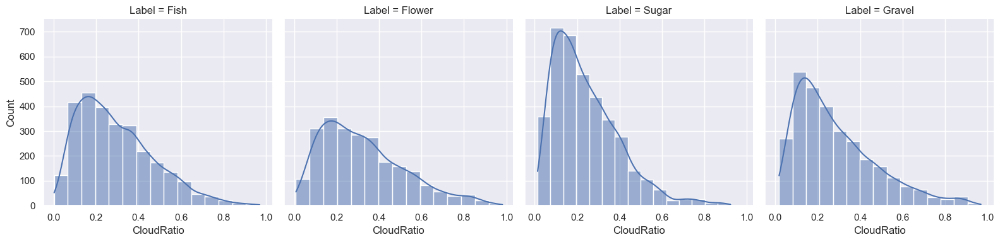

In [5]:
sns.set_theme()
g = sns.FacetGrid(df, col='Label', height=4)
g.map_dataframe(sns.histplot, 'CloudRatio', kde=True, bins=15);

#### 4.2 Distribution du taux de couverture des nuages (par rapport à l'image entière) par classe de nuage

/Users/elmaestro/Software/anaconda3/envs/python38_env/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


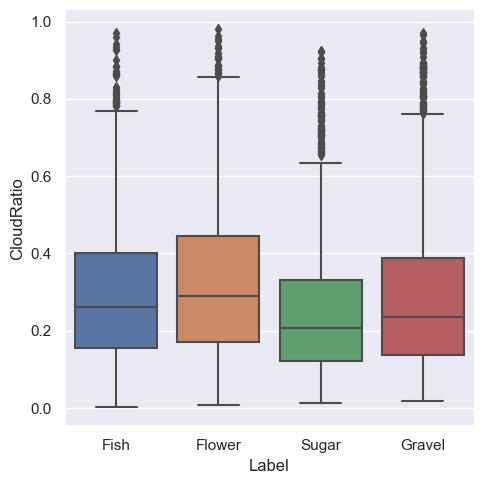

In [6]:
sns.set_theme()
sns.catplot(x='Label', y='CloudRatio', kind='box', data=df);

#### 4.3 Distribution de la moyenne des niveaux de pixel d'une zone nuageuse par classe de nuage

/Users/elmaestro/Software/anaconda3/envs/python38_env/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


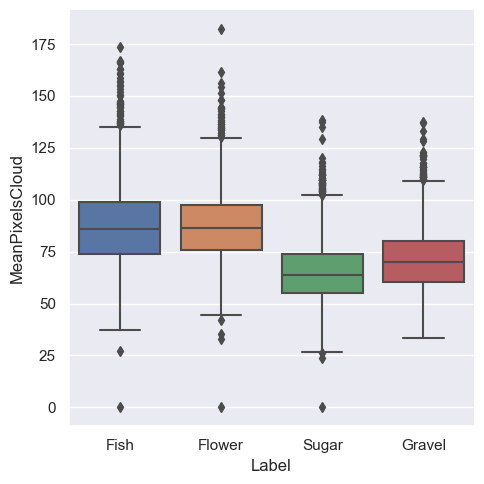

In [7]:
sns.catplot(x='Label', y='MeanPixelsCloud', kind='box', data=df);

#### 4.4 Distribution de l'écart-type des niveaux de pixel d'une zone nuageuse par classe de nuage

/Users/elmaestro/Software/anaconda3/envs/python38_env/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


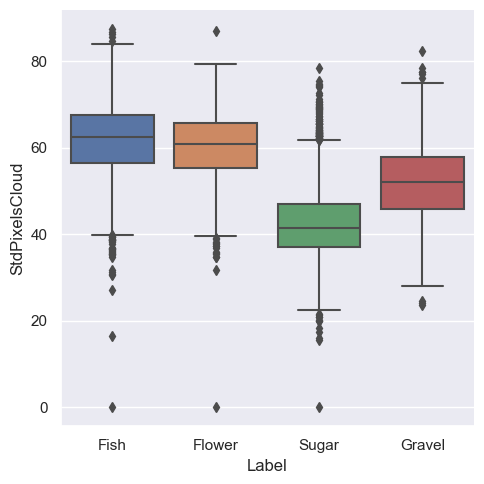

In [8]:
sns.catplot(x='Label', y='StdPixelsCloud', kind='box', data=df);

#### 4.5 Dénombrement des observations masquées de façon significative par une barre noire (plus de 20% de l'image)

In [9]:
df[['CountPixelsHiddenArea', 'RatioHiddenArea']].describe()

,CountPixelsHiddenArea,RatioHiddenArea
count,1.183600e+04,11836.000000
mean,3.108229e+05,0.106063
std,1.236730e+05,0.042220
min,1.000000e+01,0.000000
25%,2.861560e+05,0.100000
50%,3.171210e+05,0.110000
75%,4.133870e+05,0.140000
max,2.940000e+06,1.000000


In [10]:
df_hidden = df[df['RatioHiddenArea'] > 0.2][['FileId', 'CountPixelsHiddenArea', 'RatioHiddenArea']].groupby('FileId').agg({'CountPixelsHiddenArea': lambda x: x.mode().iloc[0], 'RatioHiddenArea': lambda x: x.mode().iloc[0]}).reset_index()
df_hidden = df_hidden.sort_values(by='RatioHiddenArea', ascending=False)
df_hidden

,FileId,CountPixelsHiddenArea,RatioHiddenArea
11,9925939,2940000.0,1.00
4,24884e7,2508802.0,0.85
13,f32724b,2347138.0,0.80
5,3b9a092,2142624.0,0.73
9,5265e81,1752587.0,0.60
7,400a38d,1620934.0,0.55
12,a2dc5c0,1425797.0,0.48
3,17fe76e,1308357.0,0.45
10,838cd7a,1064727.0,0.36
14,fd5aa5d,886089.0,0.30


#### 4.6 Distribution des classes de nuage

In [19]:
dist = pd.DataFrame(df['Class'].value_counts(normalize=True))
dist.reset_index(drop=False, inplace=True)
dist = dist.rename({'Class':'Ratio', 'index': 'Class'}, axis=1)
dist = dist.replace(to_replace=[0, 1, 2, 3], value=['Fish', 'Flower', 'Gravel', 'Sugar'])
dist

,Ratio,proportion
0,Sugar,0.316914
1,Gravel,0.248310
2,Fish,0.234961
3,Flower,0.199814


#### 4.7 Distribution des images selon le nombre de classes qui les caractérisent

In [12]:
# Comment se répartis le 'Nombre de classes par image' sur le jeu de données ?
class_per_image = df.groupby('FileId').agg({'Class': 'count'}).rename({'Class':'Occurence'}, axis=1)
dist = pd.DataFrame(class_per_image['Occurence'].value_counts())
dist.reset_index(drop=False, inplace=True)
dist.sort_values(by='Occurence', ascending=True, inplace=True)
dist = dist.rename({'count':'Count'}, axis=1)
dist = dist.replace(to_replace=[1, 2, 3, 4], value=['1 Label(s)', '2 Label(s)', '3 Label(s)', '4 Label(s)'])
dist

,Occurence,Count
2,1 Label(s),1348
0,2 Label(s),2372
1,3 Label(s),1560
3,4 Label(s),266


/Users/elmaestro/Software/anaconda3/envs/python38_env/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


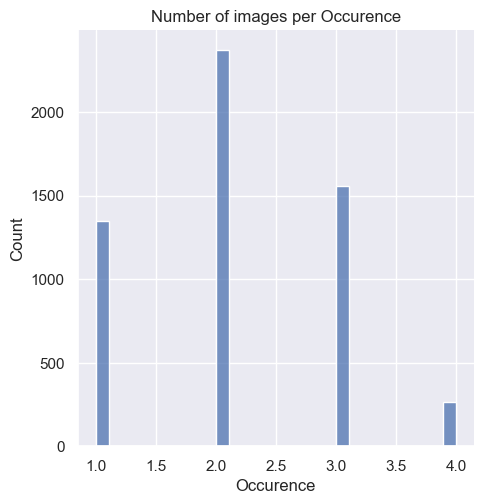

In [13]:
sns.set_theme()
g = sns.displot(data=class_per_image['Occurence'])
g.set(title='Number of images per Occurence');

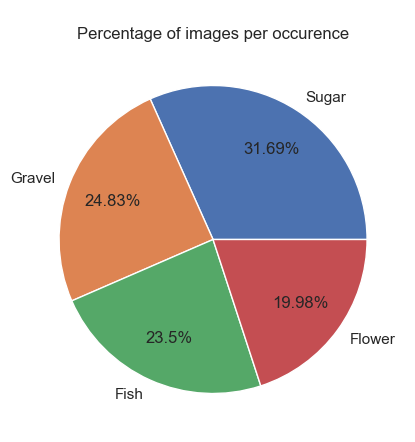

In [21]:
plt.figure(figsize = (5, 5))
plt.pie(
    x = dist['proportion'], 
    labels=dist['Ratio'],
    autopct=lambda x: str(round(x, 2)) + '%',
    pctdistance =0.7, 
    labeldistance=1.1,
    shadow = False
)
plt.title("\nPercentage of images per occurence");

#### 4.8 Dénombrement des observations décrites par des segments non-disjoints

In [ ]:
IS_SELECT_ADJACENT = True
GAP_LIMIT_LOW = 0
GAP_LIMIT_HIGH = 0.10 # 10%

if IS_SELECT_ADJACENT:
    sample = df[(df['BoxMaskGap'] >= GAP_LIMIT_LOW) & (df['BoxMaskGap'] < GAP_LIMIT_HIGH)].sort_values(by='BoxMaskGap', ascending=False)
else:
    sample = df
    
sample.head(10)

In [ ]:
sample.describe()

## 5. Visualisation des données

#### 5.1 Image multi-classes

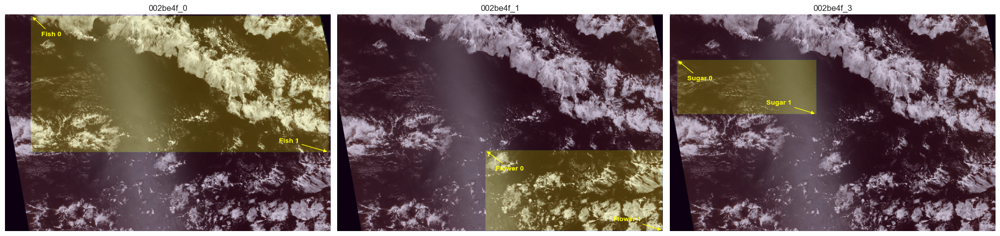

In [15]:
%run utils.ipynb

ImageIds = ['002be4f_0', '002be4f_1', '002be4f_3']
showImages(ImageIds, 1, 3, df, 2100, 1400, 'images/', hide_axis=True, show_mask=True)

#### 5.2 Images decrites par des segments compactes

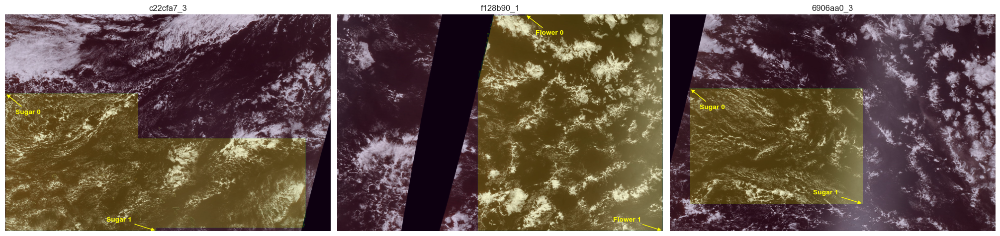

In [16]:
%run utils.ipynb

ImageIds = ['c22cfa7_3', 'f128b90_1', '6906aa0_3']
showImages(ImageIds, 1, 3, df, 2100, 1400, 'images/', hide_axis=True, show_mask=True)

#### 5.3 Images mono-classe decrites par des segments disjoints

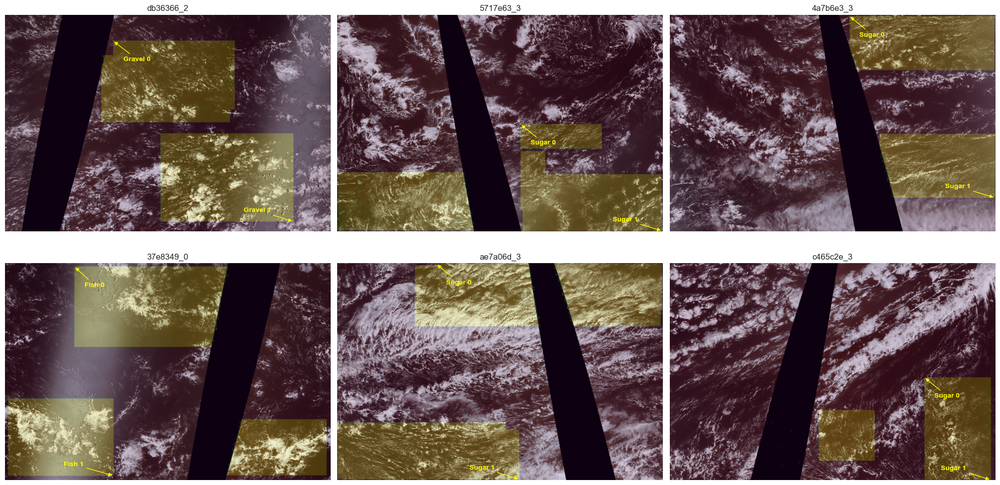

In [17]:
%run utils.ipynb

ImageIds = ['db36366_2', '5717e63_3', '4a7b6e3_3', '37e8349_0', 'ae7a06d_3', 'c465c2e_3']
showImages(ImageIds, 2, 3, df, 2100, 1400, 'images/', hide_axis=True, show_mask=True)

#### 5.4 Images présentant une zone cachée significative

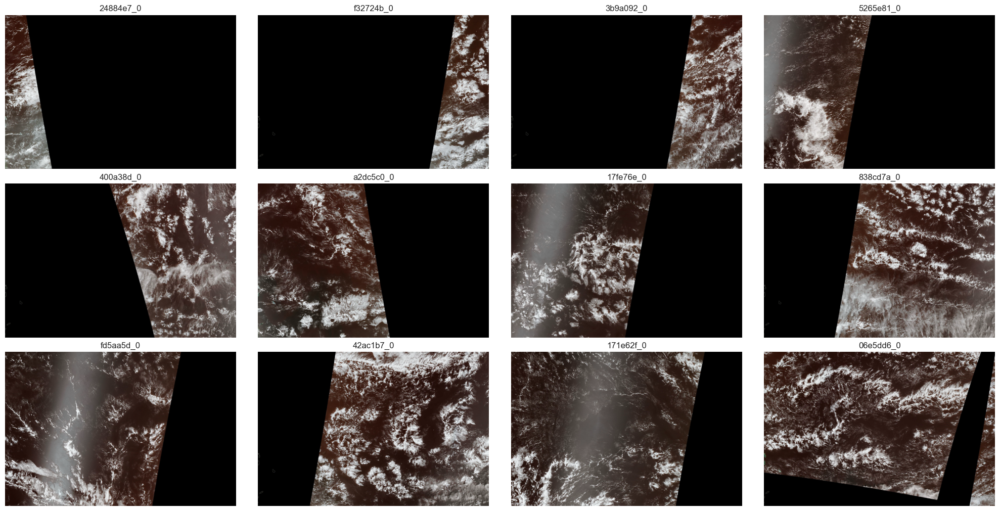

In [18]:
%run utils.ipynb

ImageIds = ['24884e7_0', 'f32724b_0', '3b9a092_0', '5265e81_0', '400a38d_0', 'a2dc5c0_0', '17fe76e_0', '838cd7a_0', 'fd5aa5d_0', '42ac1b7_0', '171e62f_0', '06e5dd6_0']
showImages(ImageIds, 3, 4, df, 2100, 1400, 'images/', hide_axis=True, show_mask=False)